In [2]:
import pandas as pd
import numpy as np
#import cv2
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [3]:
dfData = pd.read_csv("c:/Users/PC/pipeline-trees/data/in/Greehil_especes_Lidar_canopee_zonal_statistics_filtre2.csv", sep=",")


In [4]:
dfData

,fid,area,MNH_max,genus,species,height,numero,classe,conifere,Intensity_mean,Intensity_stdev,Nbreturns_mean,Nbreturns_stdev
0,7431,32.00,5.001015,Olea,europaea,5.20,9,Feuillu,2,1896.761250,1077.754210,1.618750,0.642961
1,18223,12.44,5.001206,Ligustrum,lucidum,5.68,9,Feuillu,2,1886.704180,751.407889,1.437299,0.551313
2,7394,8.20,5.001770,Olea,europaea,5.98,8,Conifère,1,1382.263415,695.833327,1.853659,0.744442
3,2914,16.92,5.002029,Pinus,pinea,5.79,8,Conifère,1,1418.408983,685.368021,1.678487,0.519761
4,468,14.88,5.002682,Tilia,tomentosa,5.80,9,Feuillu,2,1850.518919,1335.572664,1.227027,0.455980
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17511,7536,126.56,30.221561,Platanus,hispanica,24.59,9,Feuillu,2,1224.854747,647.509616,2.160759,0.982495
17512,15390,78.76,30.474590,Populus,nigra,31.11,9,Feuillu,2,1310.097436,745.907543,2.131795,0.956792
17513,7547,66.20,30.693611,Platanus,hispanica,30.08,9,Feuillu,2,1154.267554,636.502990,2.292978,1.044471
17514,19434,75.24,30.791969,Platanus,hispanica,31.94,9,Feuillu,2,1260.565657,752.652531,2.471558,1.000991


# Statistique classique

# Indexation 2 


# Dataframe

## Violin plot


violin plot 

- show the probability density of the data at different values
- the violin plot shows the full distribution of the data
- The violin plot can be used in multimodal data (more than one peak).
- violin plots are used to represent comparison of a variable distribution (or sample distribution) across different "categories" (for example, temperature distribution compared between day and night, or distribution of car prices compared across different car makers).
(Wikipedia : https://en.wikipedia.org/wiki/Violin_plot)


<Axes: xlabel='height'>

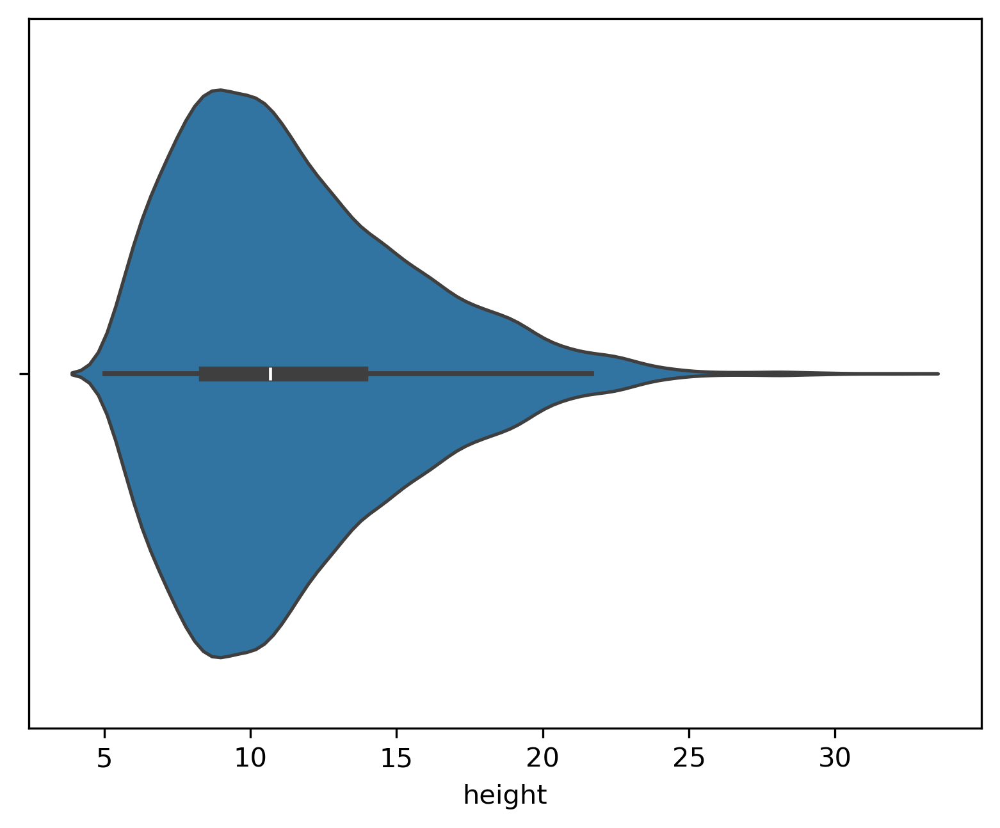

In [5]:

sns.violinplot(x=dfData['height'])


## Spearman

In statistics, correlation refers to the strength and direction of a relationship between two variables. The value of a correlation coefficient can range from -1 to 1, with the following interpretations:

-1: a perfect negative relationship between two variables

0: no relationship between two variables

1: a perfect positive relationship between two variables

One special type of correlation is called Spearman Rank Correlation, which is used to measure the correlation between two ranked variables. (e.g. rank of a student’s math exam score vs. rank of their science exam score in a class).

source : https://www.statology.org/spearman-correlation-python/

### Test-reference spearman



In [6]:
#create DataFrame
test_data = pd.DataFrame({'student': ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J'],
                   'math': [70, 78, 90, 87, 84, 86, 91, 74, 83, 85],
                   'science': [90, 94, 79, 86, 84, 83, 88, 92, 76, 75]})

In [7]:
from scipy.stats import spearmanr

#calculate Spearman Rank correlation and corresponding p-value
rho, p = spearmanr(test_data['math'], test_data['science'])

In [8]:
#print Spearman rank correlation and p-value
print(rho, p)

-0.41818181818181815 0.22911284098281892


Autre syntaxe

In [9]:
#extract Spearman Rank correlation coefficient
spearmanr(test_data['math'], test_data['science'])[0]

-0.41818181818181815

In [10]:
#extract p-value of Spearman Rank correlation coefficient
spearmanr(test_data['math'], test_data['science'])[1] 

0.22911284098281892

## CORRÉLATIONS DE SPEARMAN

- 

### V1

In [11]:
dfData.columns

Index(['fid', 'area', 'MNH_max', 'genus', 'species', 'height', 'numero',
       'classe', 'conifere', 'Intensity_mean', 'Intensity_stdev',
       'Nbreturns_mean', 'Nbreturns_stdev'],
      dtype='object')

In [12]:
from scipy import stats
from scipy.stats import spearmanr, ttest_ind, ttest_rel, shapiro, normaltest

correlation_data = dfData[['fid', 'area', 'MNH_max', 'genus', 'species', 'height', 'numero',
       'classe', 'conifere', 'Intensity_mean', 'Intensity_stdev',
       'Nbreturns_mean', 'Nbreturns_stdev']].copy()
#type(correlation_data)
#print(correlation_data) copie du data frame
#print(sources_columns)

In [13]:
dfData.columns

Index(['fid', 'area', 'MNH_max', 'genus', 'species', 'height', 'numero',
       'classe', 'conifere', 'Intensity_mean', 'Intensity_stdev',
       'Nbreturns_mean', 'Nbreturns_stdev'],
      dtype='object')

In [14]:
correlation_data = dfData

In [15]:
correlation_data

,fid,area,MNH_max,genus,species,height,numero,classe,conifere,Intensity_mean,Intensity_stdev,Nbreturns_mean,Nbreturns_stdev
0,7431,32.00,5.001015,Olea,europaea,5.20,9,Feuillu,2,1896.761250,1077.754210,1.618750,0.642961
1,18223,12.44,5.001206,Ligustrum,lucidum,5.68,9,Feuillu,2,1886.704180,751.407889,1.437299,0.551313
2,7394,8.20,5.001770,Olea,europaea,5.98,8,Conifère,1,1382.263415,695.833327,1.853659,0.744442
3,2914,16.92,5.002029,Pinus,pinea,5.79,8,Conifère,1,1418.408983,685.368021,1.678487,0.519761
4,468,14.88,5.002682,Tilia,tomentosa,5.80,9,Feuillu,2,1850.518919,1335.572664,1.227027,0.455980
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17511,7536,126.56,30.221561,Platanus,hispanica,24.59,9,Feuillu,2,1224.854747,647.509616,2.160759,0.982495
17512,15390,78.76,30.474590,Populus,nigra,31.11,9,Feuillu,2,1310.097436,745.907543,2.131795,0.956792
17513,7547,66.20,30.693611,Platanus,hispanica,30.08,9,Feuillu,2,1154.267554,636.502990,2.292978,1.044471
17514,19434,75.24,30.791969,Platanus,hispanica,31.94,9,Feuillu,2,1260.565657,752.652531,2.471558,1.000991


In [16]:
print(correlation_data.dtypes)
print(correlation_data.head())


fid                  int64
area               float64
MNH_max            float64
genus               object
species             object
height             float64
numero               int64
classe              object
conifere             int64
Intensity_mean     float64
Intensity_stdev    float64
Nbreturns_mean     float64
Nbreturns_stdev    float64
dtype: object
     fid   area   MNH_max      genus    species  height  numero    classe  \
0   7431  32.00  5.001015       Olea   europaea    5.20       9   Feuillu   
1  18223  12.44  5.001206  Ligustrum    lucidum    5.68       9   Feuillu   
2   7394   8.20  5.001770       Olea   europaea    5.98       8  Conifère   
3   2914  16.92  5.002029      Pinus      pinea    5.79       8  Conifère   
4    468  14.88  5.002682      Tilia  tomentosa    5.80       9   Feuillu   

   conifere  Intensity_mean  Intensity_stdev  Nbreturns_mean  Nbreturns_stdev  
0         2     1896.761250      1077.754210        1.618750         0.642961  
1         2 

In [17]:
from sklearn.preprocessing import LabelEncoder

# On crée un encodeur pour chaque colonne
encoder_genus = LabelEncoder()
encoder_species = LabelEncoder()
encoder_classe = LabelEncoder()

# On transforme
correlation_data['genus_encoded'] = encoder_genus.fit_transform(correlation_data['genus'])
correlation_data['species_encoded'] = encoder_species.fit_transform(correlation_data['species'])
correlation_data['classe_encoded'] = encoder_classe.fit_transform(correlation_data['classe'])

print(correlation_data[['genus', 'genus_encoded']].drop_duplicates())
print(correlation_data[['species', 'species_encoded']].drop_duplicates())
print(correlation_data[['classe', 'classe_encoded']].drop_duplicates())


             genus  genus_encoded
0             Olea             58
1        Ligustrum             47
3            Pinus             65
4            Tilia             93
5             Acer              2
...            ...            ...
12456      Searsia             81
13406   Pterocarya             72
14931  Metasequoia             54
15219         Ilex             39
16878      Sequoia             83

[102 rows x 2 columns]
                species  species_encoded
0              europaea               55
1               lucidum               89
3                 pinea              120
4             tomentosa              157
5             campestre               29
...                 ...              ...
14931  glyptostroboides               67
15219        aquifolium               12
15729          globulus               66
16148           radiata              131
16539           petraea              118

[169 rows x 2 columns]
         classe  classe_encoded
0       Feuillu     

In [18]:
X = correlation_data[['area', 'MNH_max', 'height', 'Intensity_mean', 'Intensity_stdev',
        'Nbreturns_mean', 'Nbreturns_stdev', 'genus_encoded', 'species_encoded']]

y = correlation_data['classe_encoded']


In [19]:
correlation_data.columns

Index(['fid', 'area', 'MNH_max', 'genus', 'species', 'height', 'numero',
       'classe', 'conifere', 'Intensity_mean', 'Intensity_stdev',
       'Nbreturns_mean', 'Nbreturns_stdev', 'genus_encoded', 'species_encoded',
       'classe_encoded'],
      dtype='object')

In [20]:
# 1) Liste de tes colonnes finales
cols_corr = [
    'area', 'MNH_max', 'height', 'numero',
    'conifere', 'Intensity_mean', 'Intensity_stdev',
    'Nbreturns_mean', 'Nbreturns_stdev',
    'genus_encoded', 'species_encoded', 'classe_encoded'
]

# 2) Extraire ces colonnes du DataFrame
correlation_data_numeric = correlation_data[cols_corr]

# 3) Calculer la matrice de corrélation de Spearman
spearman_corr = correlation_data_numeric.corr(method='spearman')

print(spearman_corr.round(3))


                  area  MNH_max  height  numero  conifere  Intensity_mean  \
area             1.000    0.470   0.423  -0.041    -0.041           0.026   
MNH_max          0.470    1.000   0.967   0.083     0.083          -0.132   
height           0.423    0.967   1.000   0.102     0.102          -0.105   
numero          -0.041    0.083   0.102   1.000     1.000           0.195   
conifere        -0.041    0.083   0.102   1.000     1.000           0.195   
Intensity_mean   0.026   -0.132  -0.105   0.195     0.195           1.000   
Intensity_stdev  0.040   -0.042  -0.029   0.178     0.178           0.661   
Nbreturns_mean  -0.023    0.226   0.185  -0.007    -0.007          -0.677   
Nbreturns_stdev  0.138    0.468   0.431   0.011     0.011          -0.567   
genus_encoded   -0.058    0.135   0.147  -0.037    -0.037          -0.131   
species_encoded -0.057    0.032   0.036  -0.175    -0.175          -0.256   
classe_encoded  -0.027    0.108   0.126   0.926     0.926           0.175   

In [21]:
# Calcul de la matrice de corrélation de Spearman
spearman_corr = correlation_data_numeric.corr(method='spearman')
#print(spearman_corr.round(3))


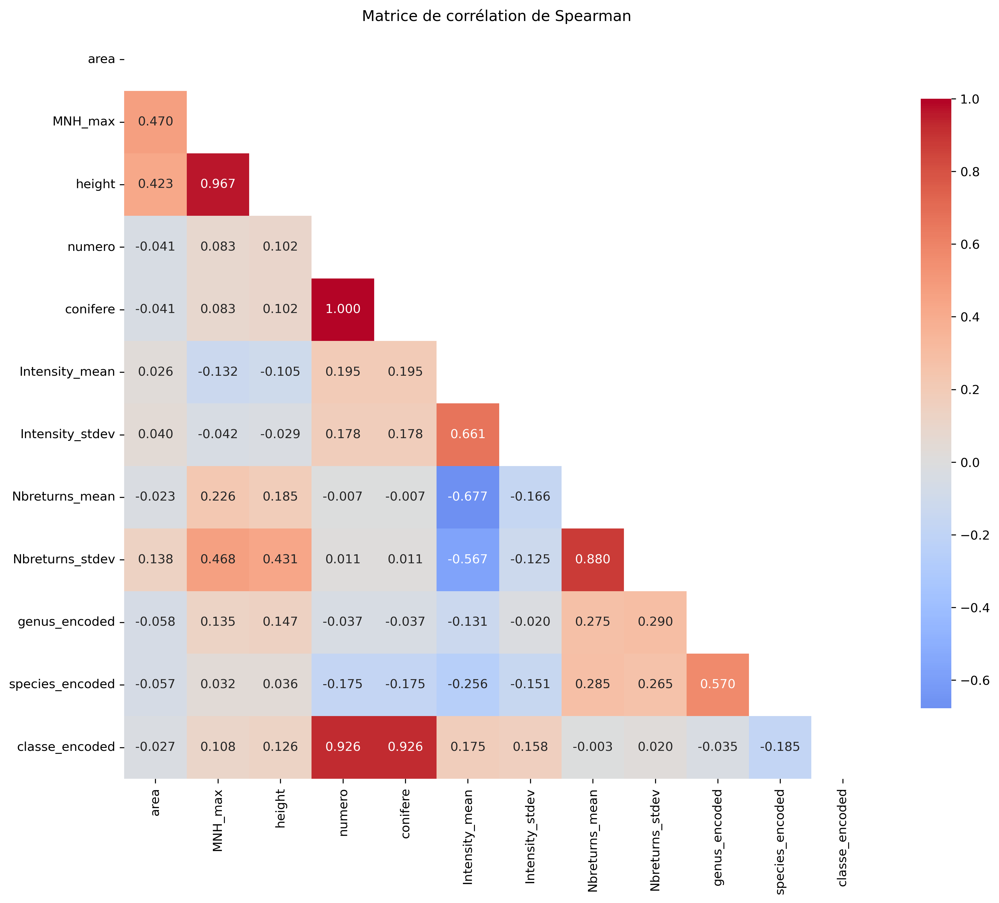

In [22]:
plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(spearman_corr, dtype=bool))
sns.heatmap(spearman_corr, 
            mask=mask,
            annot=True, 
            cmap='coolwarm', 
            center=0,
            square=True,
            fmt='.3f',
            cbar_kws={"shrink": .8})
plt.title('Matrice de corrélation de Spearman ')
plt.tight_layout()
plt.savefig('correlation_spearman_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

Explication
- La corrélation de Spearman est une mesure statistique qui évalue dans quelle mesure une relation monotone (croissante ou décroissante) existe entre deux variables.
- Chaque case indique la corrélation de Spearman entre deux parametres. 
- La couleur représente la force et le signe de la corrélation :
    Bleu : corrélation négative
    Rouge : corrélation positive
    Blanc / neutre : corrélation proche de 0


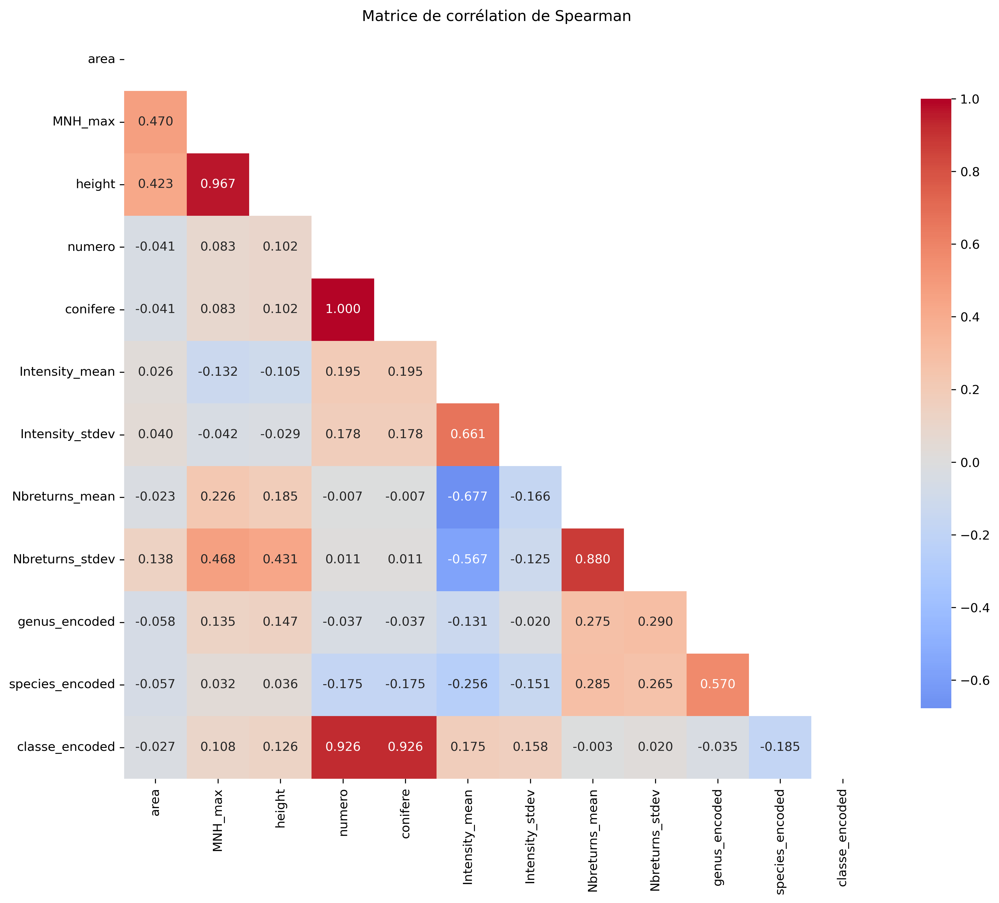

In [23]:
correlation_spear=correlation_data_numeric
correlation_spear

# Calcul des corrélations de Spearman
spearman_corr2 = correlation_spear.corr(method='spearman')

plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(spearman_corr2, dtype=bool))
sns.heatmap(spearman_corr2, 
            mask=mask,
            annot=True, 
            cmap='coolwarm', 
            center=0,
            square=True,
            fmt='.3f',
            cbar_kws={"shrink": .8})
plt.title('Matrice de corrélation de Spearman ')
plt.tight_layout()
plt.savefig('correlation_spearman_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

## Test de student

Le test $t$ de Student \cite{student_probable_1908} permet de comparer des moyennes. Il existe principalement deux variantes :

- le test $t$ pour un échantillon (vérifie si la moyenne d'un échantillon est différente d'une valeur donnée),
- le test $t$ pour deux échantillons indépendants (vérifie si deux groupes ont des moyennes différentes).


Soient $X_1, X_2, \dots, X_n$ et $Y_1, Y_2, \dots, Y_m$ deux échantillons indépendants issus de deux populations normales avec variances égales.

\begin{align*}
    H_0 &: \mu_X = \mu_Y \\
    H_1 &: \mu_X \ne \mu_Y
\end{align*}


On note les moyennes $\bar{X}$ et $\bar{Y}$, et l'estimateur commun de la variance :

$
S_p^2 = \frac{(n-1)S_X^2 + (m-1)S_Y^2}{n + m - 2}
$
La statistique $t$ est alors :
$
t = \frac{\bar{X} - \bar{Y}}{S_p \sqrt{\frac{1}{n} + \frac{1}{m}}}
$
sous $H_0$, $t$ suit une loi $t_{n + m - 2}$.

Source wikipedia et autres sites avec article student_probable_1908


On a plusieurs cas possible : 

- t > 0 : La moyenne du groupe 1 est supérieure à celle du groupe 2
- t < 0 : La moyenne du groupe 1 est inférieure à celle du groupe 2
- |t| proche de 0 : Les moyennes sont très similaires
- |t| élevé : Les moyennes sont très différentes

La valeur p (probability value) est la probabilité d'observer une différence au moins aussi extrême que celle observée, si H₀ était vraie.
si :
- p < 0.001 : Différence très significative
- p < 0.01 : Différence assez significative
- p < 0.05 : Différence significative
- p ≥ 0.05 : Différence non significative

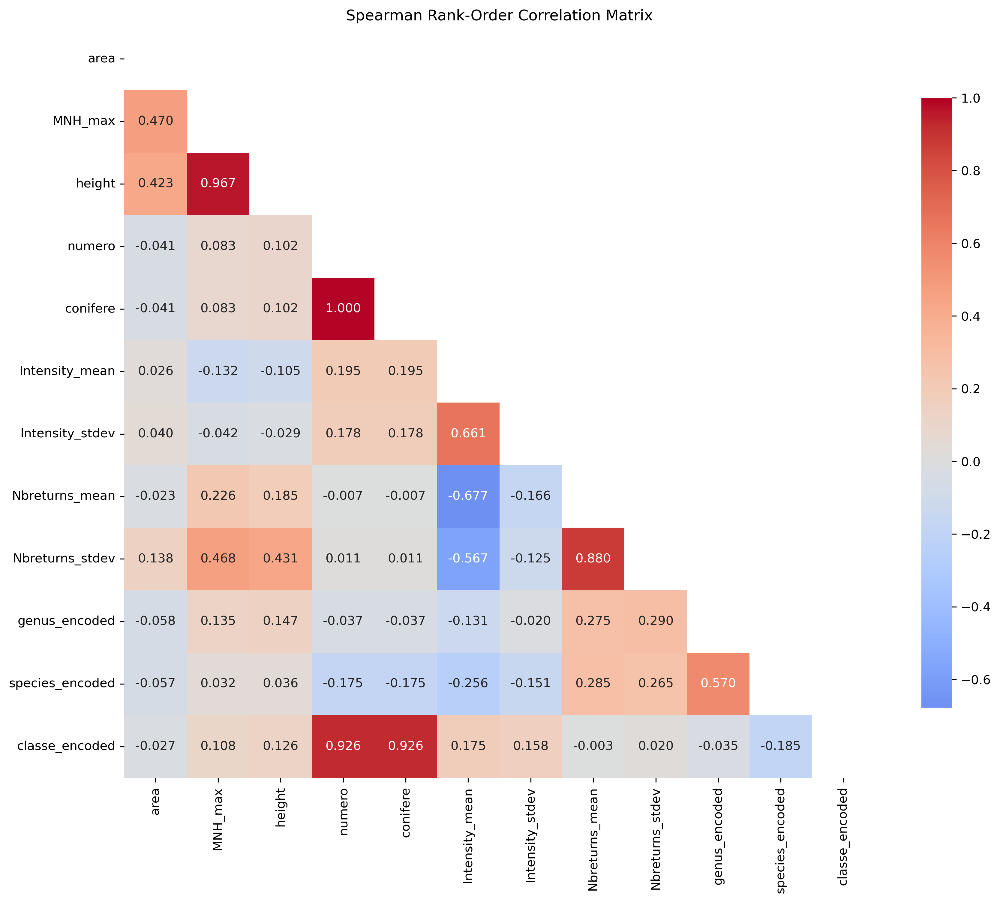

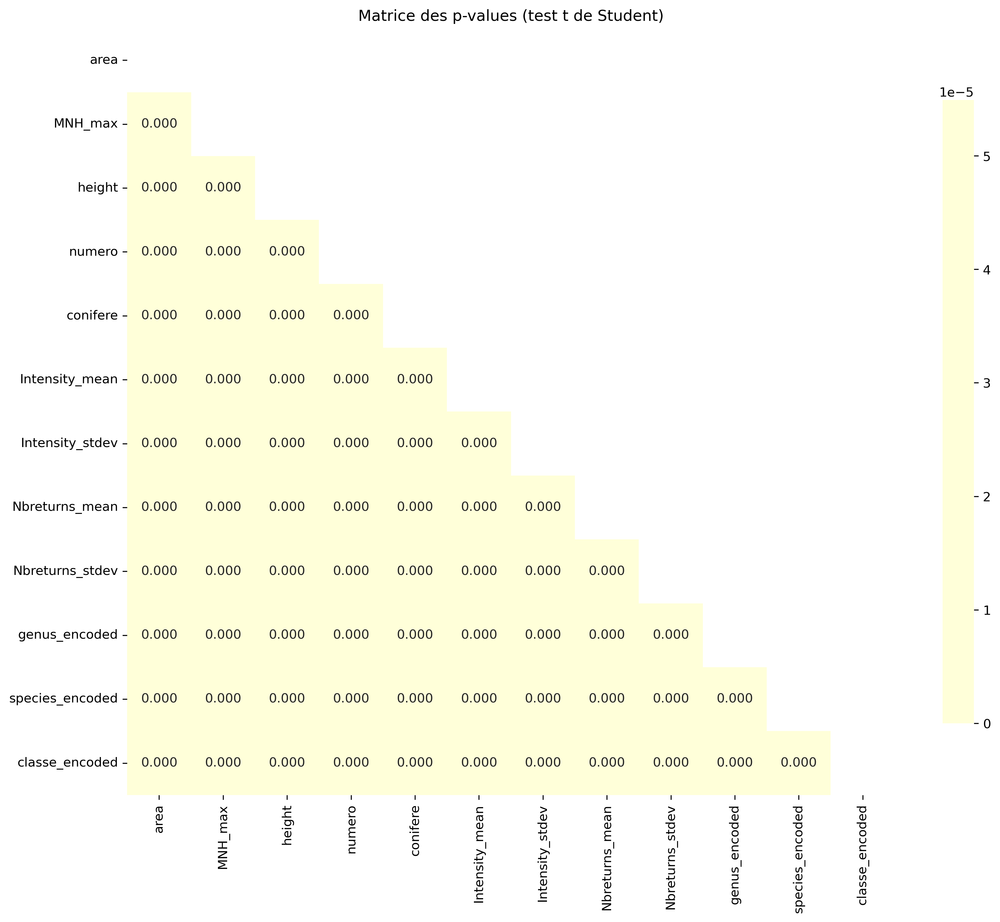

In [24]:
from scipy.stats import spearmanr, ttest_ind, ttest_rel, shapiro, normaltest, levene
# Calcul de la matrice de corrélation de Spearman
spearman_corr = correlation_spear.corr(method='spearman')

# Initialisation de la matrice des p-values pour le test de Student
student_pvals = pd.DataFrame(np.ones_like(spearman_corr),
                              index=spearman_corr.index,
                              columns=spearman_corr.columns)

# Remplissage de la matrice des p-values avec des tests t
for i in range(len(spearman_corr.columns)):
    for j in range(i+1, len(spearman_corr.columns)):
        col1 = spearman_corr.columns[i]
        col2 = spearman_corr.columns[j]
        
        data1 = correlation_spear[col1].dropna()
        data2 = correlation_spear[col2].dropna()
        common_index = data1.index.intersection(data2.index)
        data1 = data1.loc[common_index]
        data2 = data2.loc[common_index]

        if len(data1) > 2 and len(data2) > 2:
            # Test de Levene pour égalité des variances
            _, p_levene = levene(data1, data2)
            equal_var = p_levene > 0.05

            # Test t de Student
            _, p_value = ttest_ind(data1, data2, equal_var=equal_var)
            student_pvals.loc[col1, col2] = p_value
            student_pvals.loc[col2, col1] = p_value

# Heatmap de la corrélation de Spearman
plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(spearman_corr, dtype=bool))
sns.heatmap(spearman_corr, 
            mask=mask,
            annot=True, 
            cmap='coolwarm', 
            center=0,
            square=True,
            fmt='.3f',
            cbar_kws={"shrink": .8})
plt.title('Spearman Rank-Order Correlation Matrix')
plt.tight_layout()
plt.savefig('correlation_spearman_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

# Heatmap des p-values du test de Student
plt.figure(figsize=(12, 10))
sns.heatmap(student_pvals, 
            mask=mask,
            annot=True, 
            cmap='YlGnBu', 
            center=0.05,
            square=True,
            fmt='.3f',
            cbar_kws={"shrink": .8})
plt.title('Matrice des p-values (test t de Student)')
plt.tight_layout()
plt.savefig('student_test_pvalue_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()


In [25]:
spearman_corr=correlation_spear

In [26]:
import pandas as pd
import numpy as np  # ✅ CORRECT

# Calcul de la matrice de corrélation
spearman_corr = correlation_spear.corr(method='spearman')

# Mettre la diagonale à NaN
corr_no_diag = spearman_corr.where(~np.eye(spearman_corr.shape[0], dtype=bool))  # ✅ CORRECT

# Aplatir la matrice en table longue
corr_pairs = corr_no_diag.unstack().dropna()

# Supprimer les doublons (A,B) = (B,A)
corr_pairs = corr_pairs.reset_index()
corr_pairs.columns = ['Variable_1', 'Variable_2', 'Spearman_Corr']
corr_pairs['Pair'] = corr_pairs.apply(lambda row: tuple(sorted([row['Variable_1'], row['Variable_2']])), axis=1)
corr_pairs = corr_pairs.drop_duplicates('Pair').drop('Pair', axis=1)

# Trier par corrélation absolue décroissante
corr_pairs['AbsCorr'] = corr_pairs['Spearman_Corr'].abs()
corr_pairs_sorted = corr_pairs.sort_values(by='AbsCorr', ascending=False)

print(corr_pairs_sorted.head(10))


         Variable_1       Variable_2  Spearman_Corr   AbsCorr
36           numero         conifere       1.000000  1.000000
12          MNH_max           height       0.967099  0.967099
43           numero   classe_encoded       0.925908  0.925908
54         conifere   classe_encoded       0.925908  0.925908
84   Nbreturns_mean  Nbreturns_stdev       0.880358  0.880358
61   Intensity_mean   Nbreturns_mean      -0.677438  0.677438
60   Intensity_mean  Intensity_stdev       0.660673  0.660673
108   genus_encoded  species_encoded       0.570067  0.570067
62   Intensity_mean  Nbreturns_stdev      -0.567398  0.567398
0              area          MNH_max       0.470116  0.470116


<Axes: xlabel='height', ylabel='Density'>

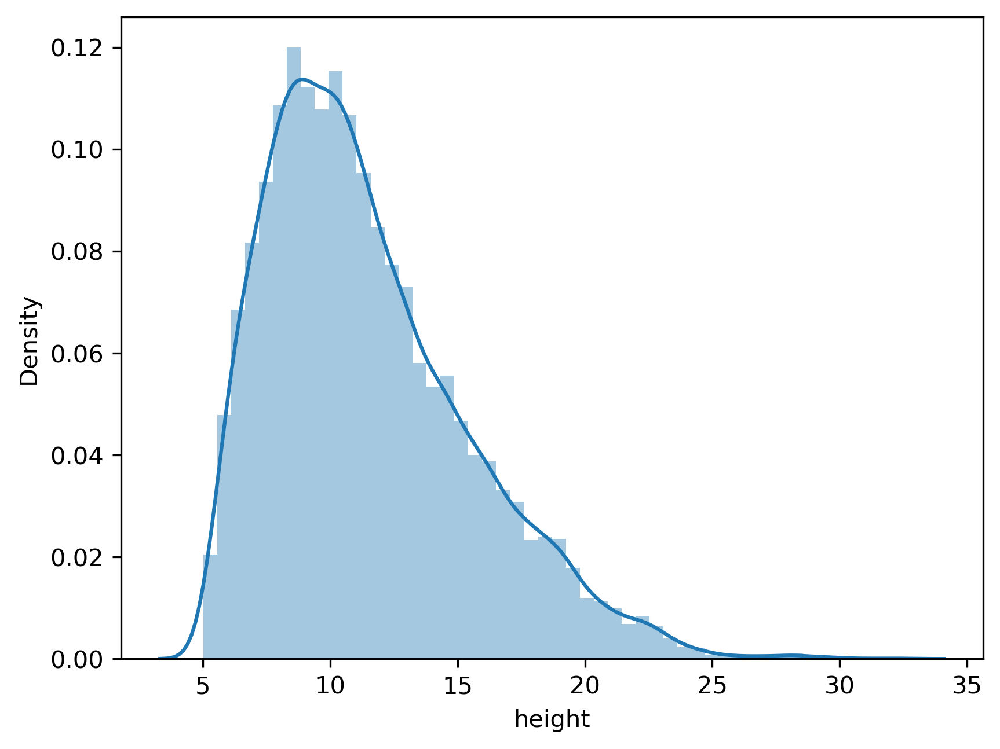

In [27]:
sns.distplot(dfData['height'])#, kde=False, bins=25)

In [28]:
correlation_data_numeric.columns

Index(['area', 'MNH_max', 'height', 'numero', 'conifere', 'Intensity_mean',
       'Intensity_stdev', 'Nbreturns_mean', 'Nbreturns_stdev', 'genus_encoded',
       'species_encoded', 'classe_encoded'],
      dtype='object')

In [29]:
sns.pairplot(correlation_data_numeric[['area', 'MNH_max', 'height', 'numero', 'conifere', 'Intensity_mean',
       'Intensity_stdev', 'Nbreturns_mean', 'Nbreturns_stdev', 'genus_encoded',
       'species_encoded', 'classe_encoded']])

## Exemples

In [30]:
crash_df=sns.load_dataset('car_crashes') #donnée test seaborn

In [31]:
crash_df

,total,speeding,alcohol,not_distracted,no_previous,ins_premium,ins_losses,abbrev
0,18.8,7.332,5.640,18.048,15.040,784.55,145.08,AL
1,18.1,7.421,4.525,16.290,17.014,1053.48,133.93,AK
2,18.6,6.510,5.208,15.624,17.856,899.47,110.35,AZ
3,22.4,4.032,5.824,21.056,21.280,827.34,142.39,AR
4,12.0,4.200,3.360,10.920,10.680,878.41,165.63,CA
5,13.6,5.032,3.808,10.744,12.920,835.50,139.91,CO
6,10.8,4.968,3.888,9.396,8.856,1068.73,167.02,CT
7,16.2,6.156,4.860,14.094,16.038,1137.87,151.48,DE
8,5.9,2.006,1.593,5.900,5.900,1273.89,136.05,DC
9,17.9,3.759,5.191,16.468,16.826,1160.13,144.18,FL


<Axes: xlabel='not_distracted', ylabel='Density'>

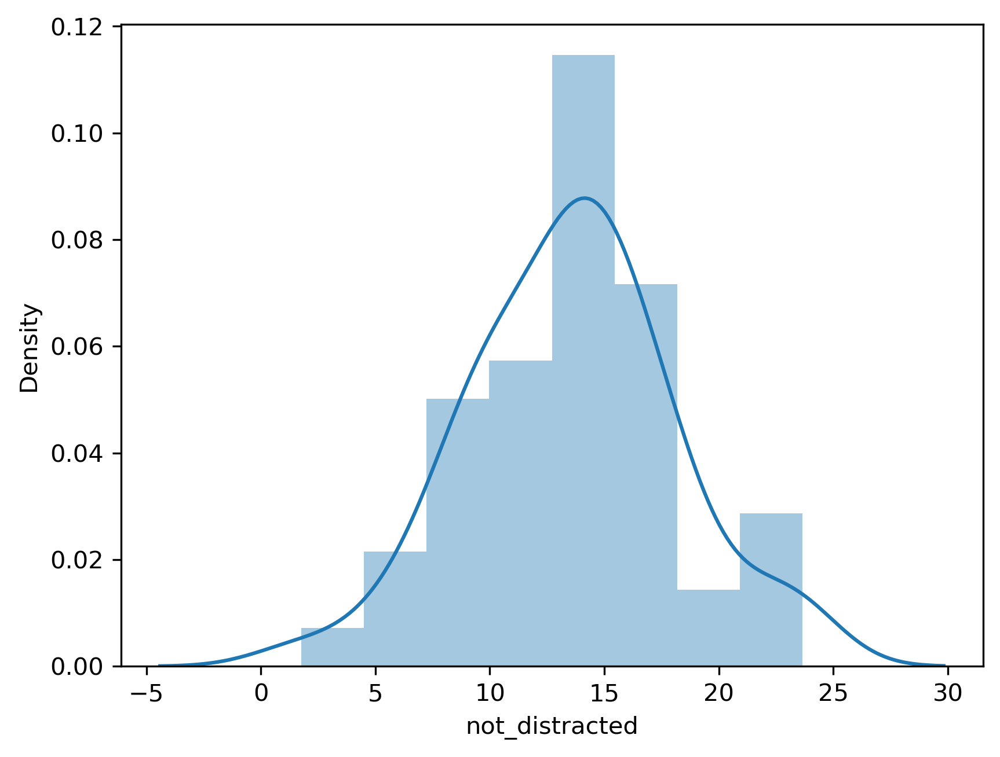

In [32]:
# distribution plot

sns.distplot(crash_df['not_distracted'])#, kde=False, bins=25)

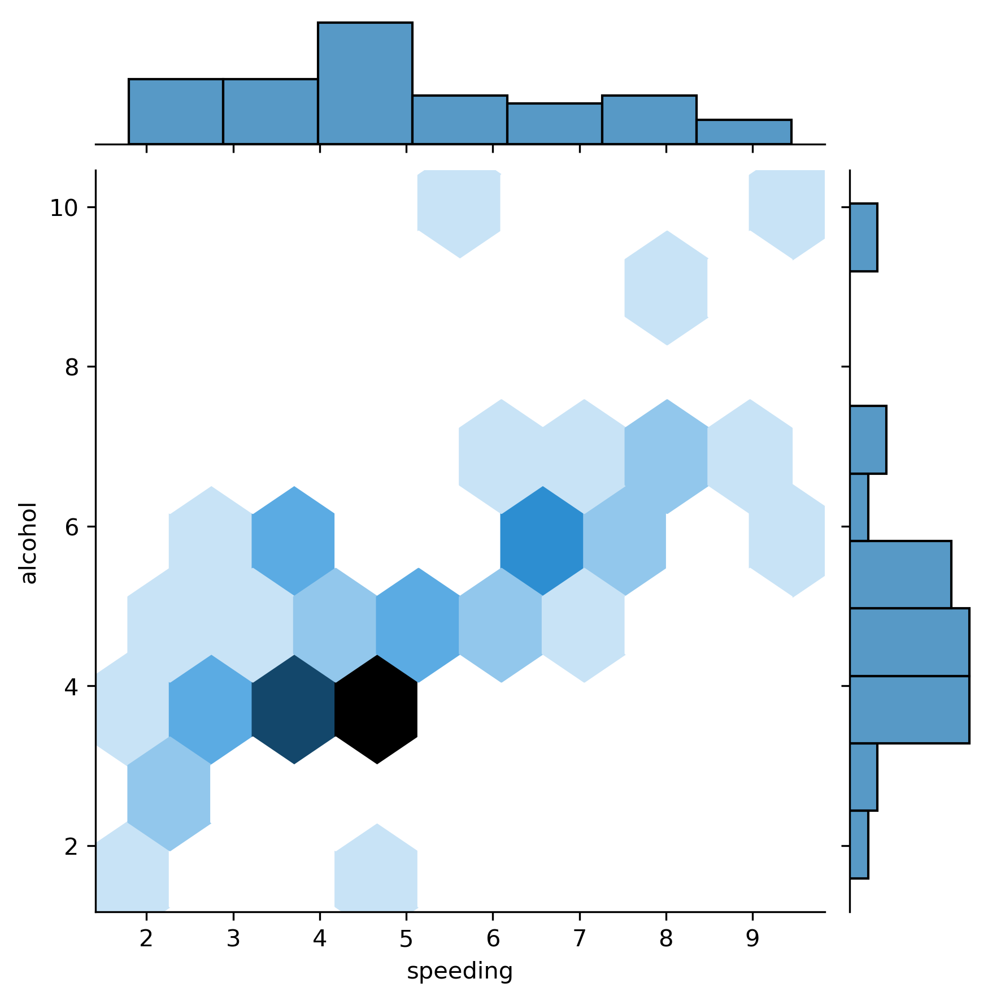

In [33]:
# Joint plot

sns.jointplot(x='speeding',y='alcohol',data=crash_df,kind='hex')
# kind ='hex'
#kind = 'kde'
#kind='reg'

<Axes: xlabel='alcohol', ylabel='Density'>

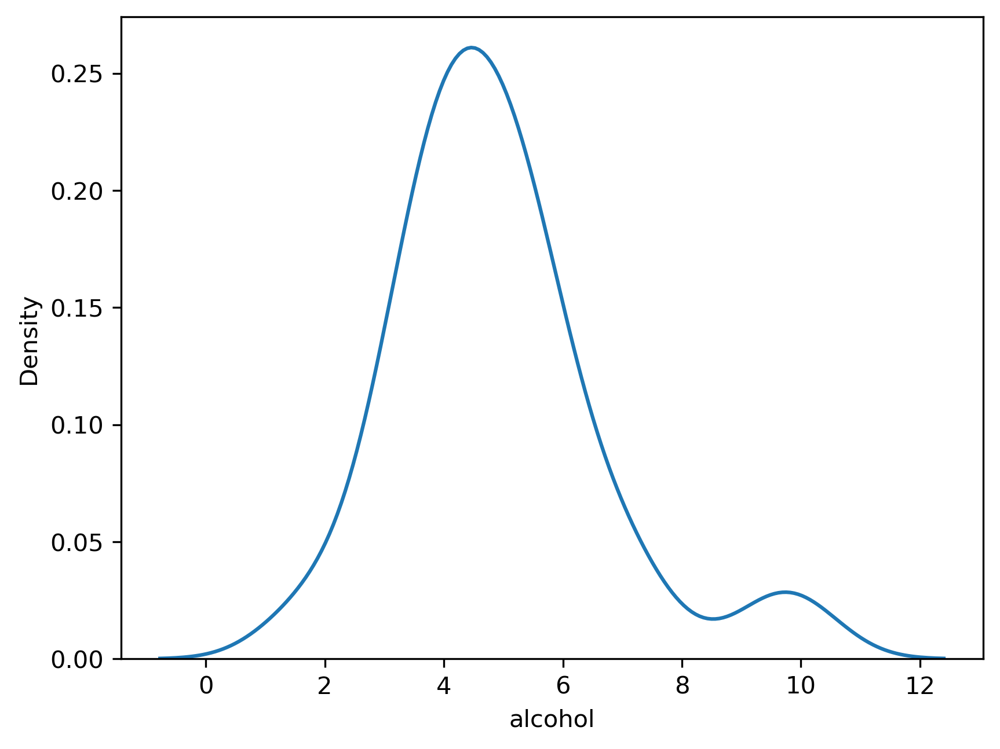

In [34]:
#kde plot

sns.kdeplot(crash_df['alcohol'])

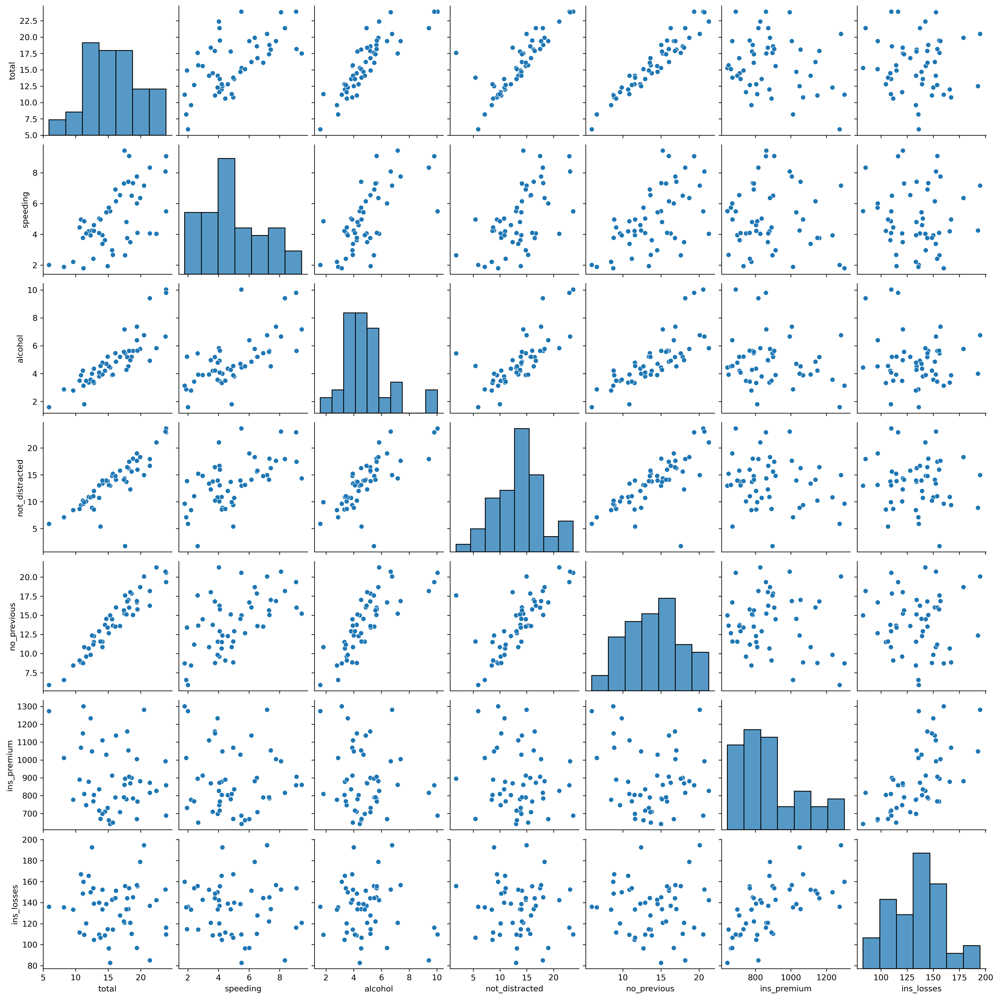

In [35]:
# pair plots
sns.pairplot(crash_df)

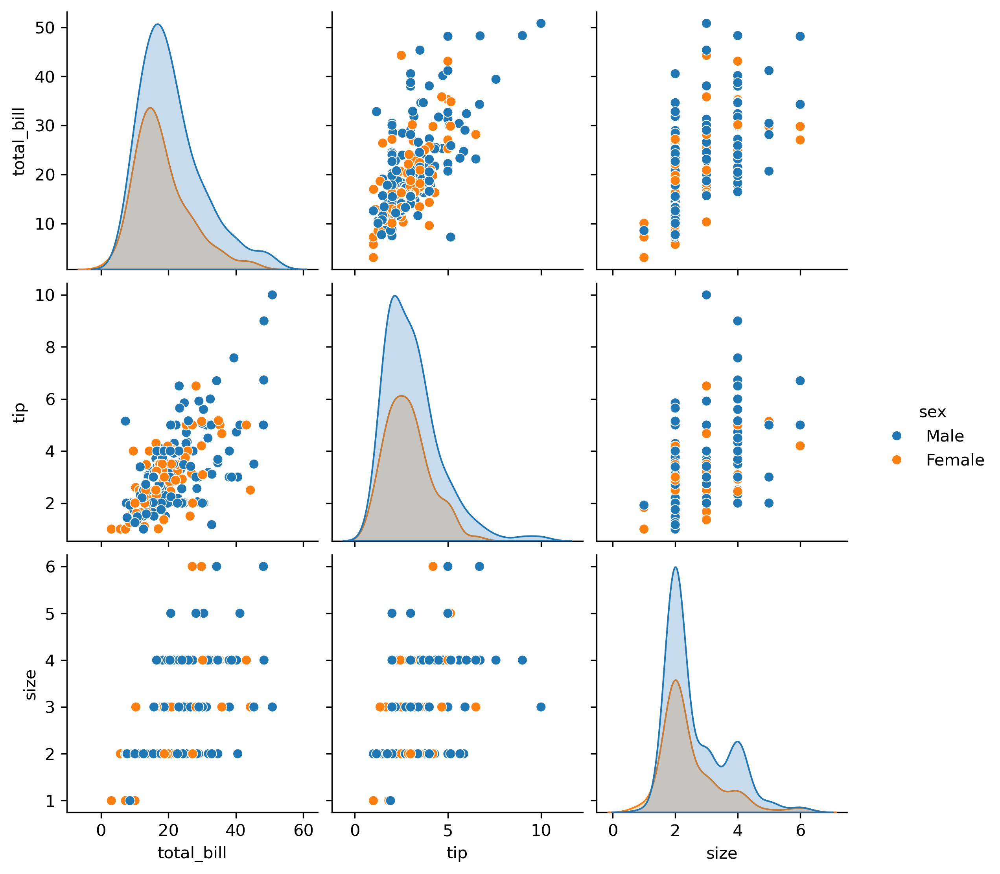

In [36]:
tips_df=sns.load_dataset('tips') #charge le dataset tips

sns.pairplot(tips_df, hue='sex')



<Axes: xlabel='tip'>

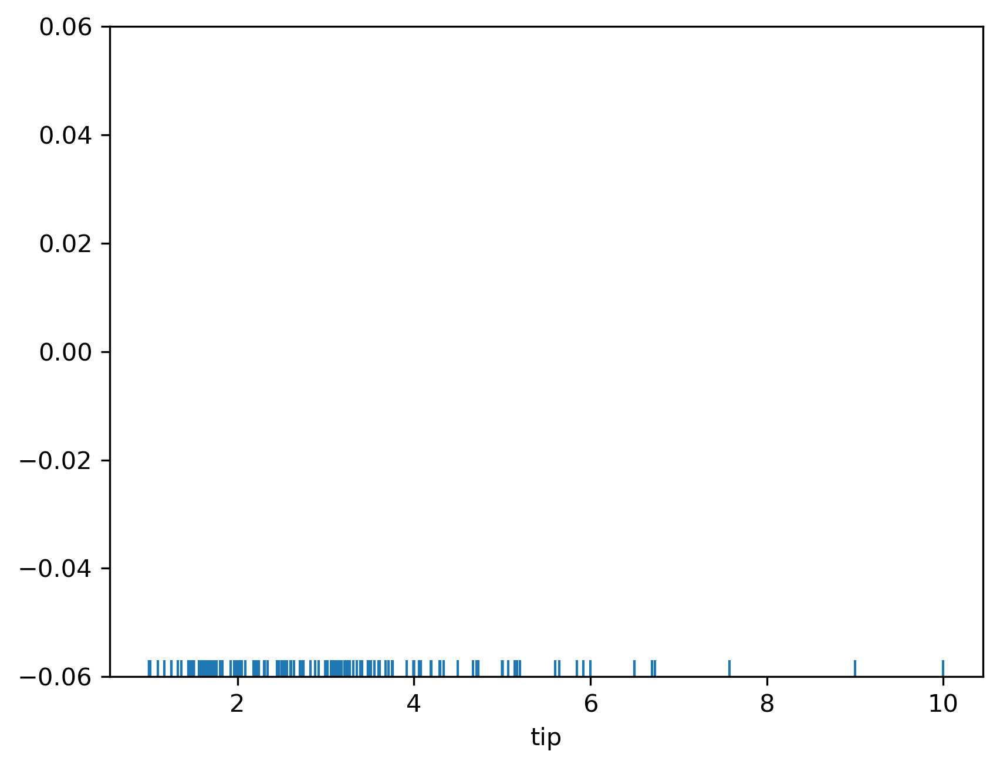

In [37]:
#rug plot

sns.rugplot(tips_df['tip'])

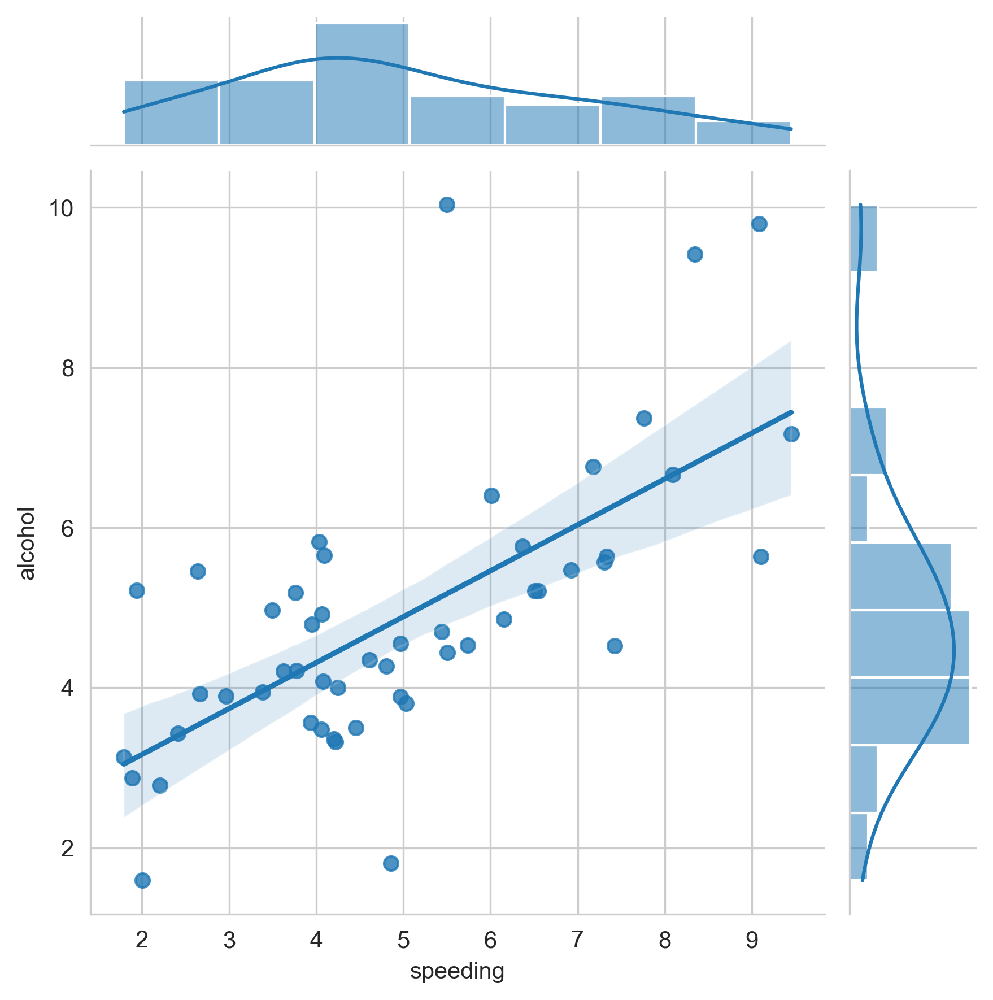

In [38]:
# style

sns.set_style('whitegrid')
sns.jointplot(x='speeding',y='alcohol',data=crash_df,kind='reg')

<Axes: xlabel='sex', ylabel='total_bill'>

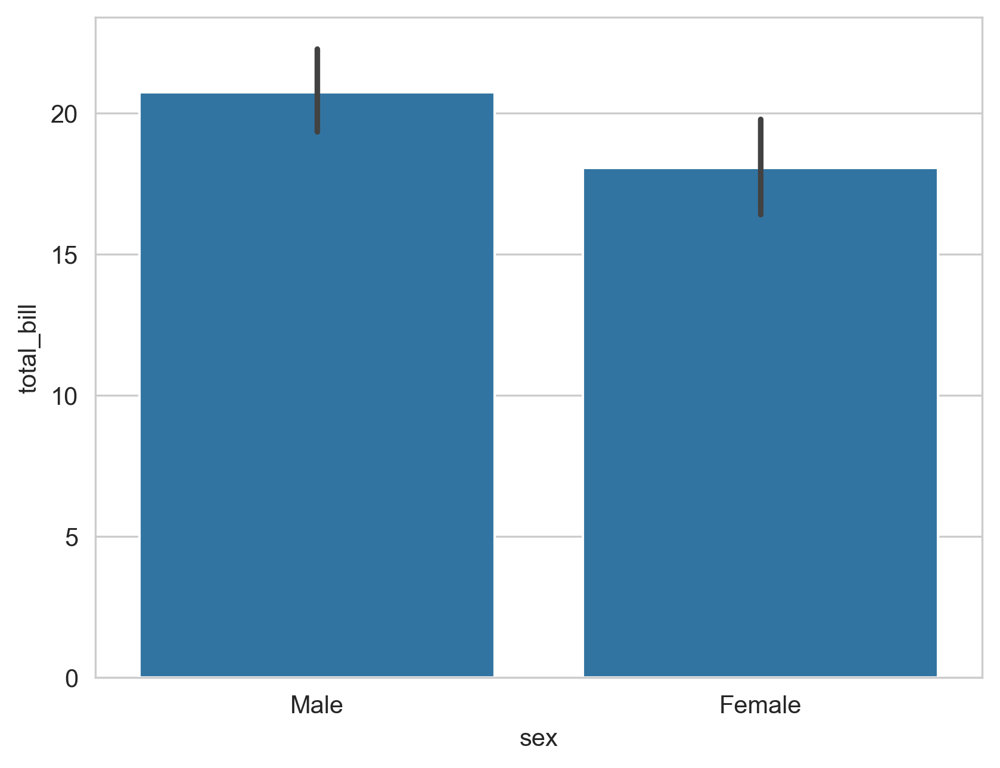

In [39]:
# bar plot
sns.barplot(x='sex',y='total_bill',data=tips_df)

<Axes: xlabel='day', ylabel='total_bill'>

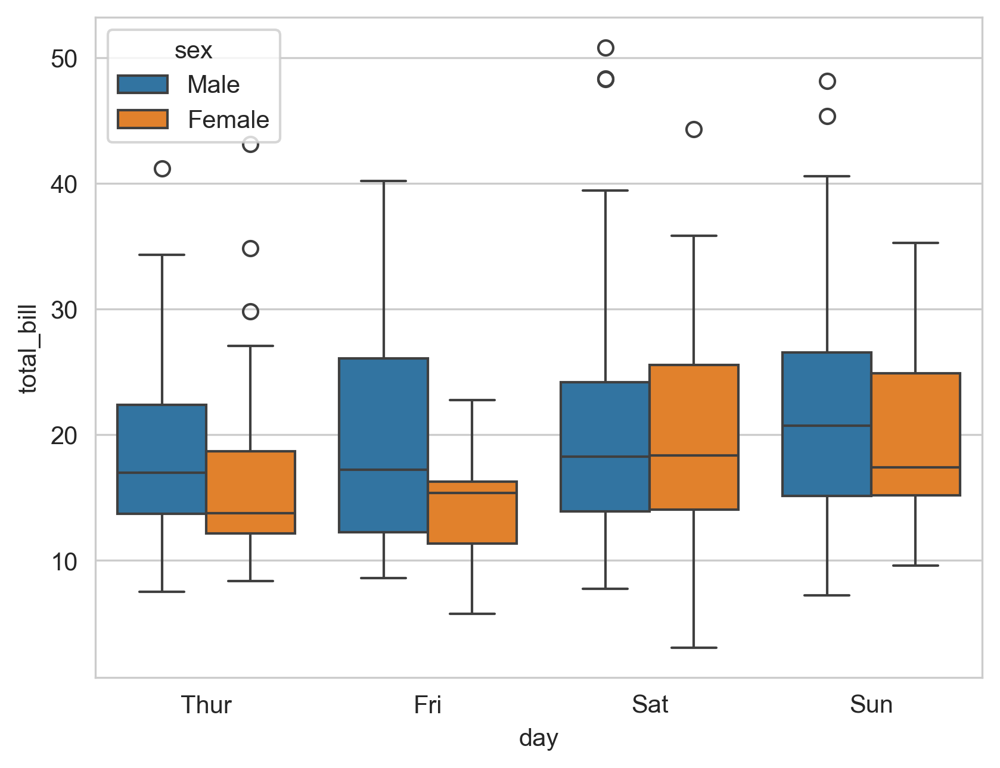

In [40]:
#box plot
sns.boxplot(x='day',y='total_bill',data=tips_df	,hue='sex')

<Axes: xlabel='day', ylabel='total_bill'>

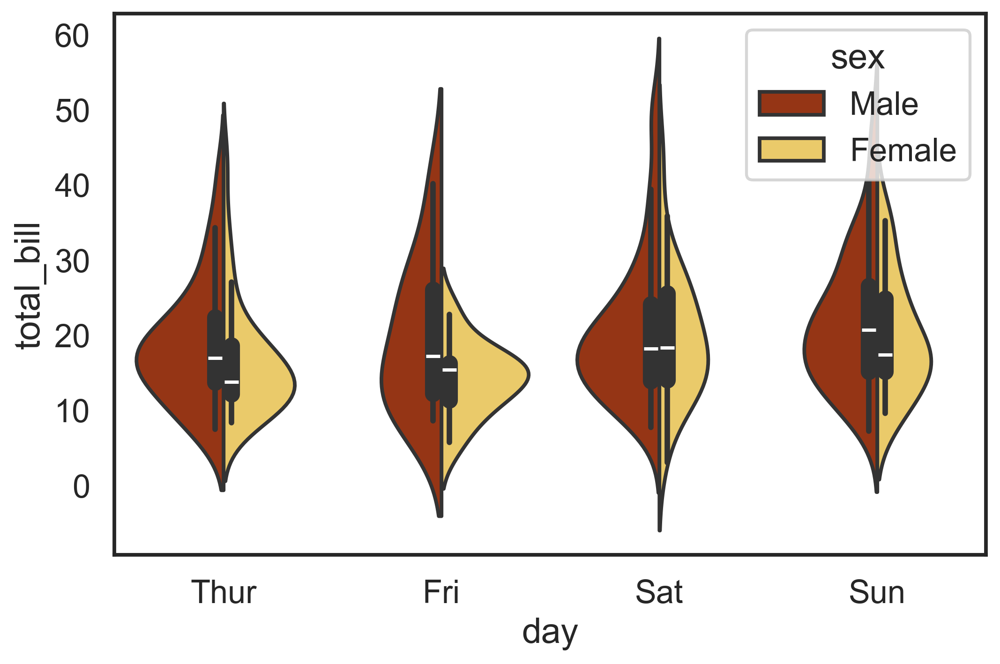

In [41]:
#violin plot
plt.figure(figsize=(8,5))
           
sns.set_style('white')
sns.set_context('talk')
           
sns.violinplot(x='day',y='total_bill',data=tips_df	,hue='sex', split=True, palette='afmhot')

<Axes: xlabel='day', ylabel='total_bill'>

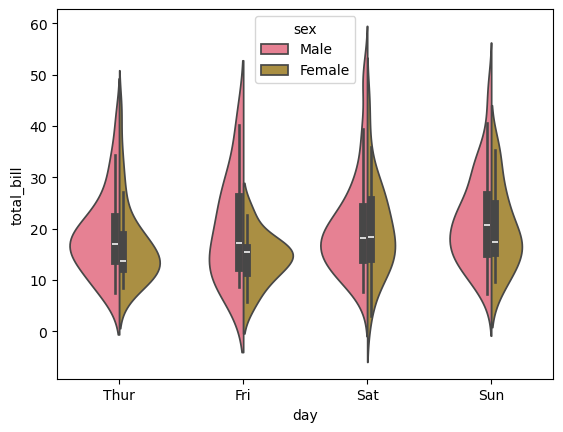

In [42]:
plt.style.use('default')
sns.set_palette("husl")
sns.violinplot(x='day',y='total_bill',data=tips_df	,hue='sex', split=True)


In [43]:
0.5*1000*27.78*27.78


385864.2

In [44]:
27500*0.11*0.5

1512.5